In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/energy-consumption-dataset/train.csv
/kaggle/input/energy-consumption-dataset/test.csv


In [3]:
testing_dataset = pd.read_csv('/kaggle/input/energy-consumption-dataset/test.csv')
training_dataset = pd.read_csv('/kaggle/input/energy-consumption-dataset/train.csv')

In [4]:
training_dataset.head()

,ID,date,lights,t1,rh_1,t2,rh_2,t3,rh_3,t4,...,rh_9,t_out,press_mm_hg,rh_out,windspeed,visibility,tdewpoint,rv1,rv2,appliances
0,2133,1/26/16 12:30,0,19.890000,45.50,19.200000,45.090000,20.390000,44.290000,19.10,...,48.700000,10.300000,761.900000,85.500000,7.500000,23.500000,7.950000,39.240863,39.240863,3.912023
1,19730,5/27/16 17:20,0,25.566667,46.56,25.890000,42.025714,27.200000,41.163333,24.70,...,46.790000,22.733333,755.200000,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812,4.605170
2,3288,2/3/16 13:00,0,22.500000,44.43,21.533333,42.590000,21.963333,44.555000,22.00,...,45.530000,6.600000,760.200000,64.000000,8.000000,40.000000,0.200000,42.054659,42.054659,4.248495
3,7730,3/5/16 9:20,0,19.790000,38.06,17.200000,40.933333,20.600000,37.163333,18.39,...,40.723333,2.100000,741.533333,94.333333,1.000000,48.666667,1.233333,12.615865,12.615865,3.688879
4,8852,3/13/16 4:20,0,20.600000,35.29,17.100000,39.790000,20.290000,37.000000,19.50,...,40.090000,-0.866667,768.266667,92.333333,1.666667,34.000000,-1.933333,10.897926,10.897926,3.688879


In [5]:
training_dataset.describe()

,ID,lights,t1,rh_1,t2,rh_2,t3,rh_3,t4,rh_4,...,rh_9,t_out,press_mm_hg,rh_out,windspeed,visibility,tdewpoint,rv1,rv2,appliances
count,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,...,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000,15788.000000
mean,9872.640170,3.808589,21.688684,40.266486,20.345215,40.428811,22.269113,39.248114,20.854106,39.047357,...,41.570982,7.418384,755.532075,79.822742,4.030780,38.330689,3.781387,25.027694,25.027694,4.305277
std,5712.930087,7.963182,1.609561,3.957219,2.196357,4.067871,2.007629,3.245545,2.051129,4.329110,...,4.156227,5.327514,7.373040,14.895451,2.436011,11.815744,4.202189,14.504991,14.504991,0.656777
min,1.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.006033,0.006033,2.302585
25%,4922.750000,0.000000,20.775937,37.399167,18.823333,37.900000,20.790000,36.900000,19.533333,35.590000,...,38.530000,3.633333,750.916667,70.333333,2.000000,29.000000,0.933333,12.510037,12.510037,3.912023
50%,9907.500000,0.000000,21.600000,39.663333,20.000000,40.500000,22.100000,38.560000,20.633333,38.463333,...,40.933333,6.933333,756.100000,84.000000,3.666667,40.000000,3.433333,24.912220,24.912220,4.094345
75%,14821.250000,0.000000,22.600000,43.060000,21.500000,43.290000,23.290000,41.760000,22.100000,42.193333,...,44.363333,10.416667,760.937500,91.666667,5.500000,40.000000,6.600000,37.665543,37.665543,4.605170
max,19734.000000,70.000000,26.260000,57.423333,29.856667,54.766667,29.236000,50.163333,26.200000,51.090000,...,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.400000,49.996530,49.996530,6.984716


In [6]:
training_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15788 entries, 0 to 15787
Data columns (total 30 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ID           15788 non-null  int64  
 1   date         15788 non-null  object 
 2   lights       15788 non-null  int64  
 3   t1           15788 non-null  float64
 4   rh_1         15788 non-null  float64
 5   t2           15788 non-null  float64
 6   rh_2         15788 non-null  float64
 7   t3           15788 non-null  float64
 8   rh_3         15788 non-null  float64
 9   t4           15788 non-null  float64
 10  rh_4         15788 non-null  float64
 11  t5           15788 non-null  float64
 12  rh_5         15788 non-null  float64
 13  t6           15788 non-null  float64
 14  rh_6         15788 non-null  float64
 15  t7           15788 non-null  float64
 16  rh_7         15788 non-null  float64
 17  t8           15788 non-null  float64
 18  rh_8         15788 non-null  float64
 19  t9  

In [7]:
testing_dataset.head()

,ID,date,lights,t1,rh_1,t2,rh_2,t3,rh_3,t4,...,t9,rh_9,t_out,press_mm_hg,rh_out,windspeed,visibility,tdewpoint,rv1,rv2
0,8980,2016-03-14 01:40:00,0,20.890000,35.400000,17.760000,39.163333,20.290000,36.900000,19.760000,...,19.29,39.03,1.766667,768.90,88.333333,2.333333,63.000000,0.000000,25.622221,25.622221
1,2754,2016-01-30 20:00:00,10,21.890000,53.100000,21.290000,45.360000,21.633333,49.226667,20.533333,...,16.29,44.20,2.700000,754.60,90.000000,3.000000,27.000000,1.200000,23.474485,23.474485
2,9132,2016-03-15 03:00:00,0,21.390000,35.500000,17.633333,40.530000,21.666667,35.200000,20.290000,...,19.39,38.29,0.200000,766.20,83.000000,2.000000,65.000000,-2.400000,0.143368,0.143368
3,14359,2016-04-20 10:10:00,0,21.390000,41.033333,23.890000,34.840000,22.033333,36.933333,22.390000,...,20.29,38.56,8.850000,767.80,70.833333,5.166667,40.000000,3.716667,10.293451,10.293451
4,8875,2016-03-13 08:10:00,0,19.963333,35.126667,16.463333,40.126667,20.000000,36.400000,19.260000,...,19.00,40.70,-0.466667,769.65,93.333333,4.000000,48.833333,-1.450000,10.754162,10.754162


In [8]:
testing_dataset.describe()

,ID,lights,t1,rh_1,t2,rh_2,t3,rh_3,t4,rh_4,...,t9,rh_9,t_out,press_mm_hg,rh_out,windspeed,visibility,tdewpoint,rv1,rv2
count,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,...,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000,3947.000000
mean,9844.439321,3.775019,21.678122,40.232752,20.325238,40.386860,22.261605,39.220044,20.860250,38.945092,...,19.475169,41.478076,7.384788,755.484710,79.461123,4.075637,38.331412,3.677986,24.829393,24.829393
std,5634.239501,7.827205,1.592180,4.066818,2.179591,4.077914,2.000269,3.290775,2.009819,4.389425,...,1.985546,4.132214,5.277380,7.504938,14.921997,2.511130,11.711729,4.163848,14.463902,14.463902
min,0.000000,0.000000,16.790000,27.233333,16.100000,20.893333,17.200000,30.133333,15.100000,28.135714,...,15.000000,29.200000,-4.966667,729.333333,25.000000,0.166667,1.000000,-6.433333,0.005322,0.005322
25%,4979.000000,0.000000,20.700000,37.200000,18.790000,37.790000,20.712857,36.878286,19.500000,35.400000,...,18.066667,38.466667,3.750000,750.933333,70.333333,2.000000,29.000000,0.800000,12.465528,12.465528
50%,9708.000000,0.000000,21.600000,39.590000,20.000000,40.500000,22.100000,38.500000,20.700000,38.260000,...,19.390000,40.730000,6.900000,756.150000,83.333333,3.666667,40.000000,3.400000,24.861751,24.861751
75%,14731.500000,0.000000,22.600000,43.090000,21.500000,43.200000,23.290000,41.790000,22.100000,42.090000,...,20.600000,44.290000,10.400000,760.900000,91.023810,5.666667,40.000000,6.400000,37.275115,37.275115
max,19733.000000,50.000000,26.260000,63.360000,29.666667,56.026667,29.198571,49.800000,26.100000,51.063333,...,24.500000,53.000000,26.033333,772.216667,100.000000,13.000000,65.000000,15.500000,49.972128,49.972128


In [9]:
testing_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3947 entries, 0 to 3946
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ID           3947 non-null   int64  
 1   date         3947 non-null   object 
 2   lights       3947 non-null   int64  
 3   t1           3947 non-null   float64
 4   rh_1         3947 non-null   float64
 5   t2           3947 non-null   float64
 6   rh_2         3947 non-null   float64
 7   t3           3947 non-null   float64
 8   rh_3         3947 non-null   float64
 9   t4           3947 non-null   float64
 10  rh_4         3947 non-null   float64
 11  t5           3947 non-null   float64
 12  rh_5         3947 non-null   float64
 13  t6           3947 non-null   float64
 14  rh_6         3947 non-null   float64
 15  t7           3947 non-null   float64
 16  rh_7         3947 non-null   float64
 17  t8           3947 non-null   float64
 18  rh_8         3947 non-null   float64
 19  t9    

In [10]:
testing_shape = testing_dataset.shape
training_shape = training_dataset.shape

print(testing_shape)
print(training_shape)

(3947, 29)
(15788, 30)


In [11]:
training_dataset.select_dtypes(include=['int','float']).columns.tolist()

['ID',
 'lights',
 't1',
 'rh_1',
 't2',
 'rh_2',
 't3',
 'rh_3',
 't4',
 'rh_4',
 't5',
 'rh_5',
 't6',
 'rh_6',
 't7',
 'rh_7',
 't8',
 'rh_8',
 't9',
 'rh_9',
 't_out',
 'press_mm_hg',
 'rh_out',
 'windspeed',
 'visibility',
 'tdewpoint',
 'rv1',
 'rv2',
 'appliances']

# **Data Exploration and Data Cleaning**

In [12]:
# Convert 'date' column to datetime
training_dataset['date'] = pd.to_datetime(training_dataset['date'])
testing_dataset['date'] = pd.to_datetime(testing_dataset['date'])

/tmp/ipykernel_33/3159550955.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  training_dataset['date'] = pd.to_datetime(training_dataset['date'])


In [13]:
#Creating a copy of Train and Test data
train_copy = training_dataset.copy()
test_copy = testing_dataset.copy()

In [14]:
#Exploratory Data Analysis on training data
# Displaying basic statistics of numerical features
print(train_copy.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15788 entries, 0 to 15787
Data columns (total 30 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   ID           15788 non-null  int64         
 1   date         15788 non-null  datetime64[ns]
 2   lights       15788 non-null  int64         
 3   t1           15788 non-null  float64       
 4   rh_1         15788 non-null  float64       
 5   t2           15788 non-null  float64       
 6   rh_2         15788 non-null  float64       
 7   t3           15788 non-null  float64       
 8   rh_3         15788 non-null  float64       
 9   t4           15788 non-null  float64       
 10  rh_4         15788 non-null  float64       
 11  t5           15788 non-null  float64       
 12  rh_5         15788 non-null  float64       
 13  t6           15788 non-null  float64       
 14  rh_6         15788 non-null  float64       
 15  t7           15788 non-null  float64       
 16  rh_7

In [15]:
# Display columns in train_copy
print("Columns in train_copy:")
print(train_copy.columns)

Columns in train_copy:
Index(['ID', 'date', 'lights', 't1', 'rh_1', 't2', 'rh_2', 't3', 'rh_3', 't4',
       'rh_4', 't5', 'rh_5', 't6', 'rh_6', 't7', 'rh_7', 't8', 'rh_8', 't9',
       'rh_9', 't_out', 'press_mm_hg', 'rh_out', 'windspeed', 'visibility',
       'tdewpoint', 'rv1', 'rv2', 'appliances'],
      dtype='object')


# **Summary Statistics for Numerical Variables**

In [16]:
# Display summary statistics for numeric columns
numeric_columns= ['lights', 't1', 'rh_1', 't2', 'rh_2', 't3', 'rh_3', 't4', 'rh_4',
                   't5', 'rh_5', 't6', 'rh_6', 't7', 'rh_7', 't8', 'rh_8', 't9', 'rh_9',
                   't_out', 'press_mm_hg', 'rh_out', 'windspeed', 'visibility',
                   'tdewpoint', 'rv1', 'rv2', 'appliances']
print("Summary Statistics for Numeric Columns:")
print(train_copy[numeric_columns].describe())

Summary Statistics for Numeric Columns:
             lights            t1          rh_1            t2          rh_2  \
count  15788.000000  15788.000000  15788.000000  15788.000000  15788.000000   
mean       3.808589     21.688684     40.266486     20.345215     40.428811   
std        7.963182      1.609561      3.957219      2.196357      4.067871   
min        0.000000     16.790000     27.023333     16.100000     20.463333   
25%        0.000000     20.775937     37.399167     18.823333     37.900000   
50%        0.000000     21.600000     39.663333     20.000000     40.500000   
75%        0.000000     22.600000     43.060000     21.500000     43.290000   
max       70.000000     26.260000     57.423333     29.856667     54.766667   

                 t3          rh_3            t4          rh_4            t5  \
count  15788.000000  15788.000000  15788.000000  15788.000000  15788.000000   
mean      22.269113     39.248114     20.854106     39.047357     19.598492   
std        

# **Finding the Missing Values**

In [17]:
#Finding the missing values
print("Missing Values in Training Data:")
print(train_copy.isnull().sum())

Missing Values in Training Data:
ID             0
date           0
lights         0
t1             0
rh_1           0
t2             0
rh_2           0
t3             0
rh_3           0
t4             0
rh_4           0
t5             0
rh_5           0
t6             0
rh_6           0
t7             0
rh_7           0
t8             0
rh_8           0
t9             0
rh_9           0
t_out          0
press_mm_hg    0
rh_out         0
windspeed      0
visibility     0
tdewpoint      0
rv1            0
rv2            0
appliances     0
dtype: int64


In [18]:
# Check for duplicate entries
print("Duplicate Values in Training Data:")
print(training_dataset.duplicated().sum())

Duplicate Values in Training Data:
0


In [ ]:
# Drop irrelevant columns
train_copy = train_copy.drop(['ID'], axis=1)
test_copy = test_copy.drop(['ID'], axis=1)

# **Visualization on Train Copy**

In [21]:
# Import necessary libraries
import seaborn as sns
import matplotlib.pyplot as plt

**Distribution of target variable**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


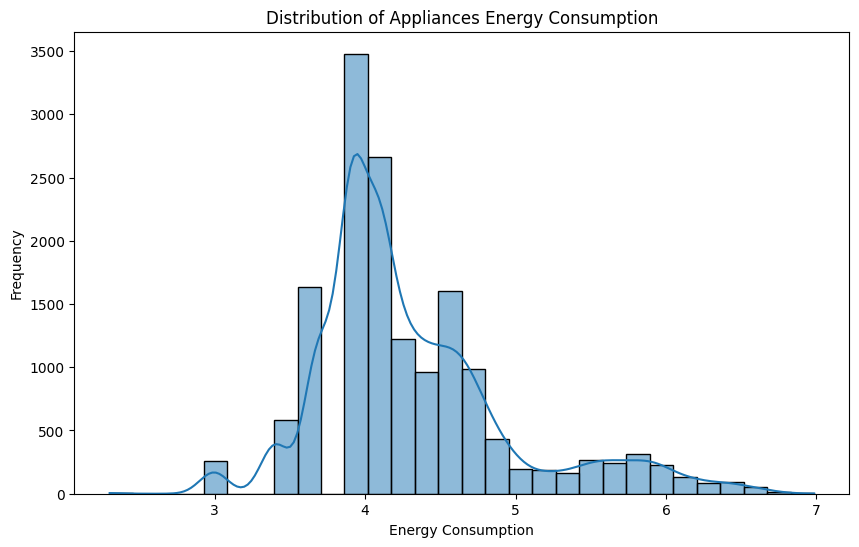

In [22]:
# Visualize the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.histplot(train_copy['appliances'], bins=30, kde=True)
plt.title('Distribution of Appliances Energy Consumption')
plt.xlabel('Energy Consumption')
plt.ylabel('Frequency')
plt.show()

**Correlation analysis**

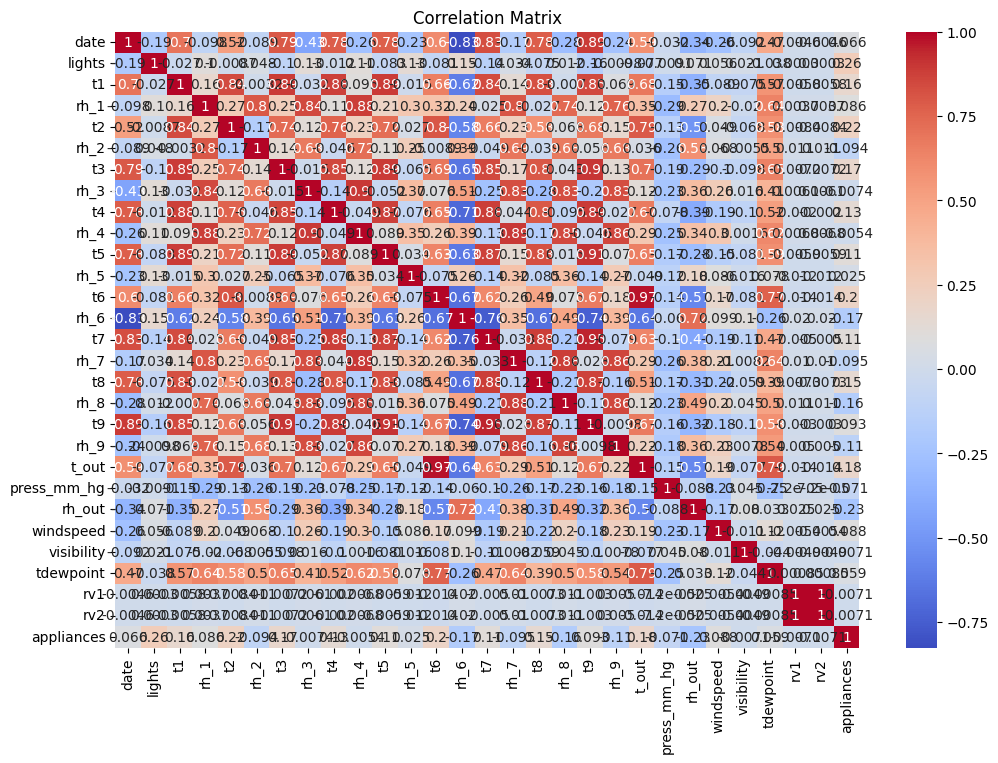

In [23]:
# Visualize the correlation between features and the target variable
plt.figure(figsize=(12, 8))
sns.heatmap(train_copy.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

**Visualization on Train Copy**

In [24]:
# Set the style for seaborn
sns.set(style="whitegrid")

# Select a subset of features for visualization
features_to_visualize = ['t_out', 'press_mm_hg', 'rh_out', 'windspeed', 'visibility',
       'tdewpoint', 'rv1', 'rv2', 'appliances']

In [25]:
import warnings
# Suppress specific warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="pandas")
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

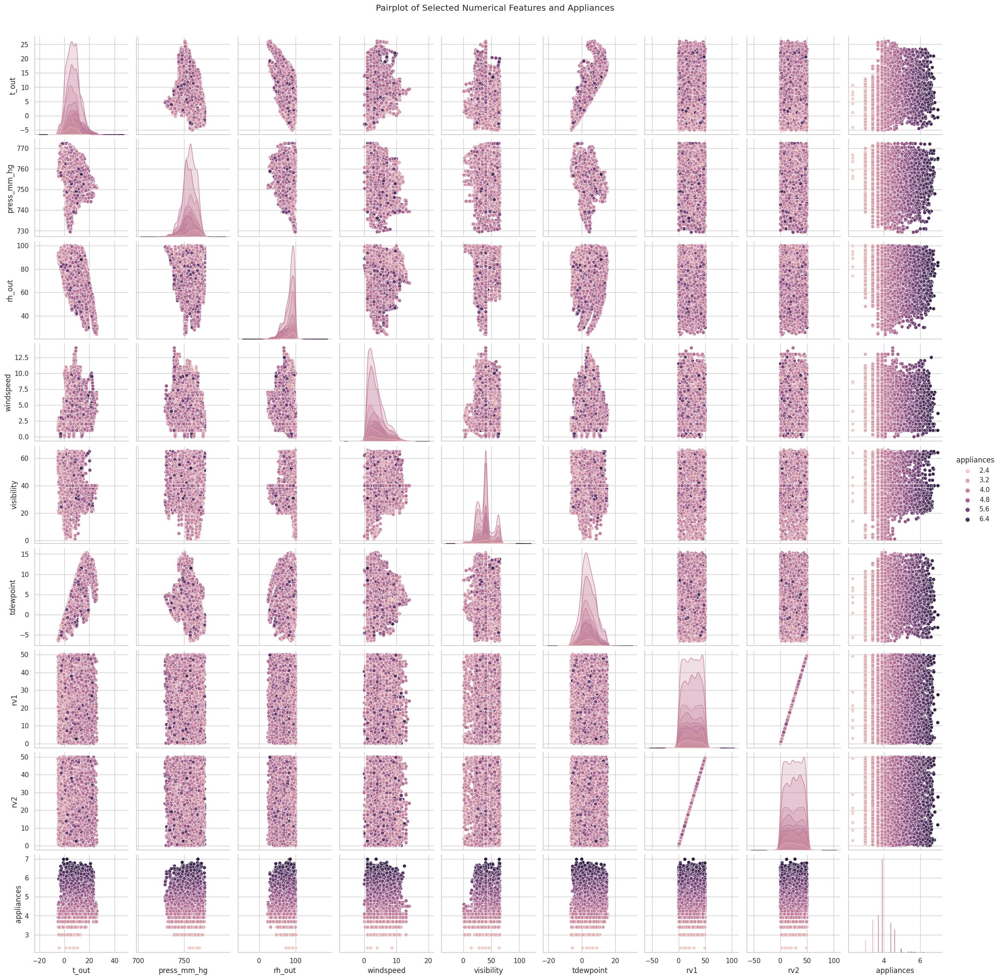

In [27]:
# Pairplot for selected features
sns.pairplot(train_copy, vars=features_to_visualize, diag_kind='kde', hue='appliances')
plt.suptitle('Pairplot of Selected Numerical Features and Appliances', y=1.02)
plt.show()

In [28]:
numeric_columns = ['lights', 't1', 'rh_1', 't2', 'rh_2', 't3', 'rh_3', 't4', 'rh_4',
                   't5', 'rh_5', 't6', 'rh_6', 't7', 'rh_7', 't8', 'rh_8', 't9', 'rh_9',
                   't_out', 'press_mm_hg', 'rh_out', 'windspeed', 'visibility',
                   'tdewpoint', 'rv1', 'rv2', 'appliances']

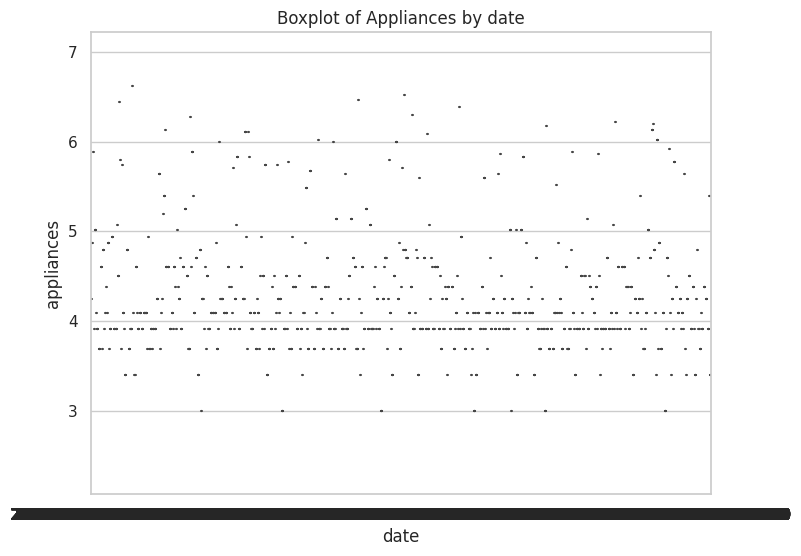

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
# Boxplots for categorical features
categorical_columns = ['date']
for column in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=column, y='appliances', data=train_copy)
    plt.title(f'Boxplot of Appliances by {column}')
    plt.show()

In [31]:
# #Pairplot for Numeric Features
# numeric_columns = train_copy_imputed.select_dtypes(include=['float64']).columns
# sns.pairplot(train_copy_imputed[numeric_columns], height=2)
# plt.show()

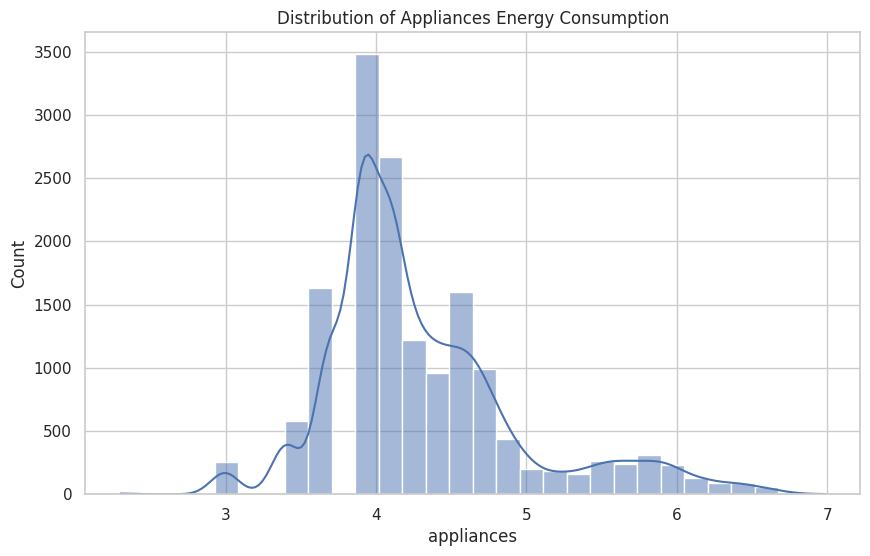

In [32]:
# Suppress specific FutureWarning related to pandas options
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn._oldcore")

# Visualize the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.histplot(train_copy['appliances'], bins=30, kde=True)
plt.title('Distribution of Appliances Energy Consumption')
plt.show()

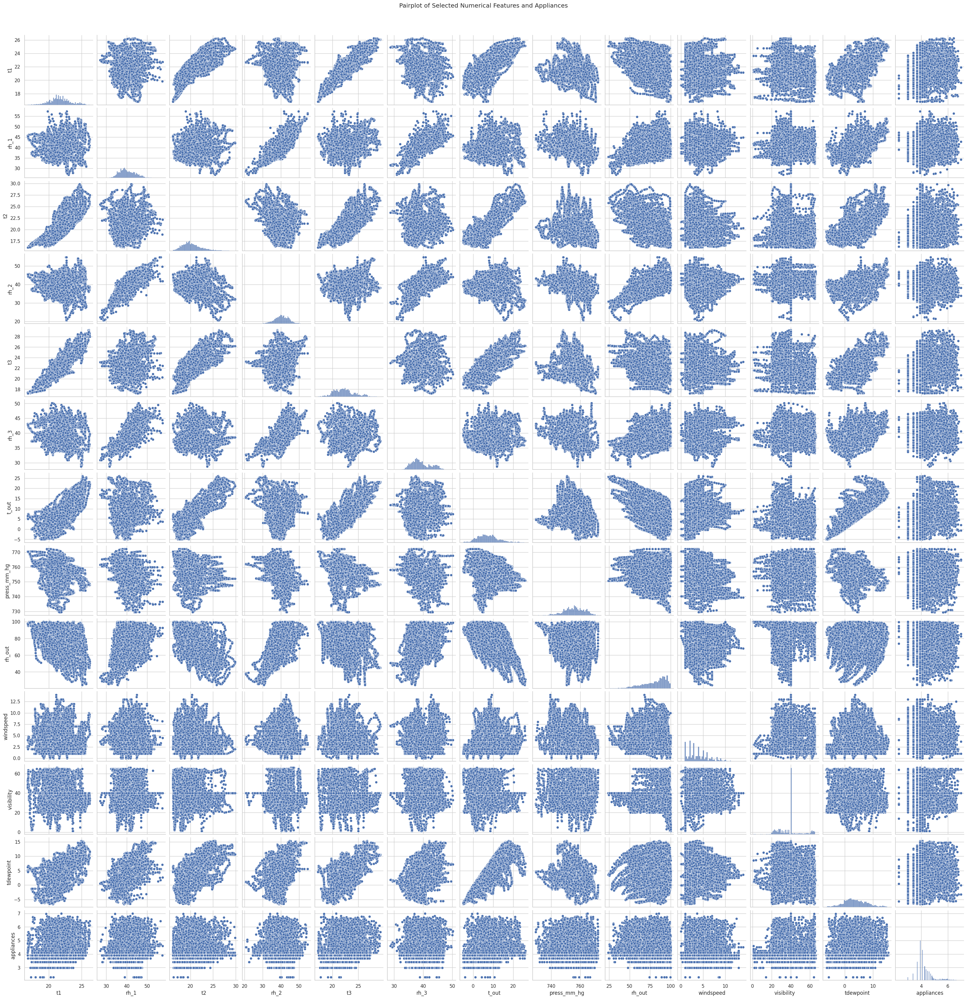

In [33]:
# Pairplot for a subset of features
features_to_visualize = [
    't1', 'rh_1', 't2', 'rh_2', 't3', 'rh_3',
    't_out', 'press_mm_hg', 'rh_out', 'windspeed',
    'visibility', 'tdewpoint', 'appliances'
]

sns.pairplot(train_copy[features_to_visualize])
plt.suptitle('Pairplot of Selected Numerical Features and Appliances', y=1.02)
plt.show()

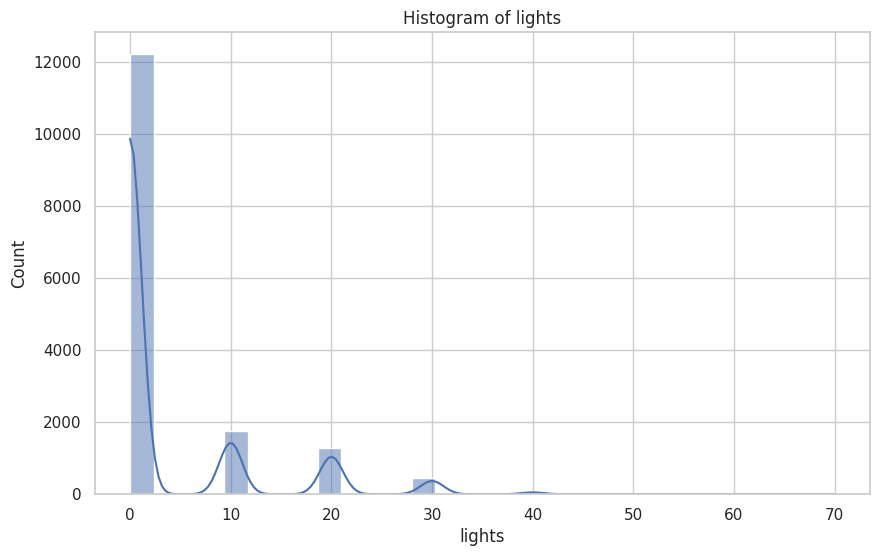

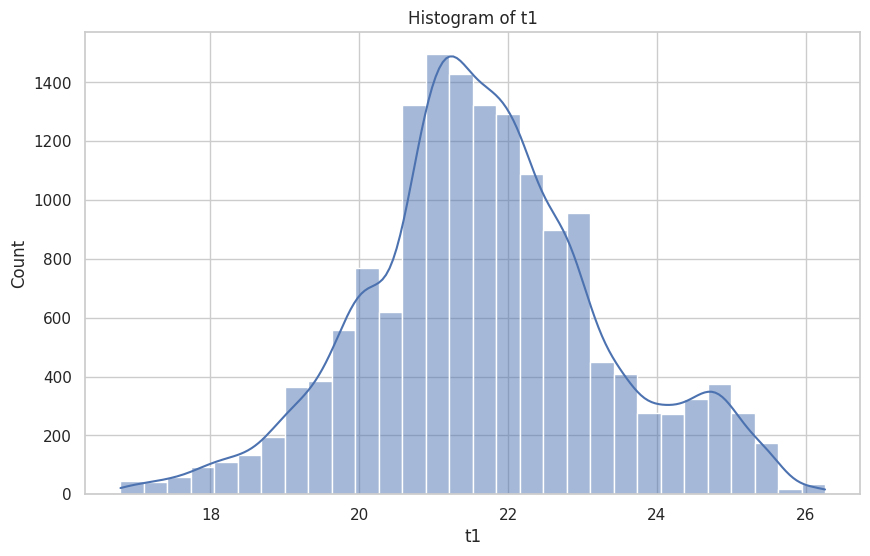

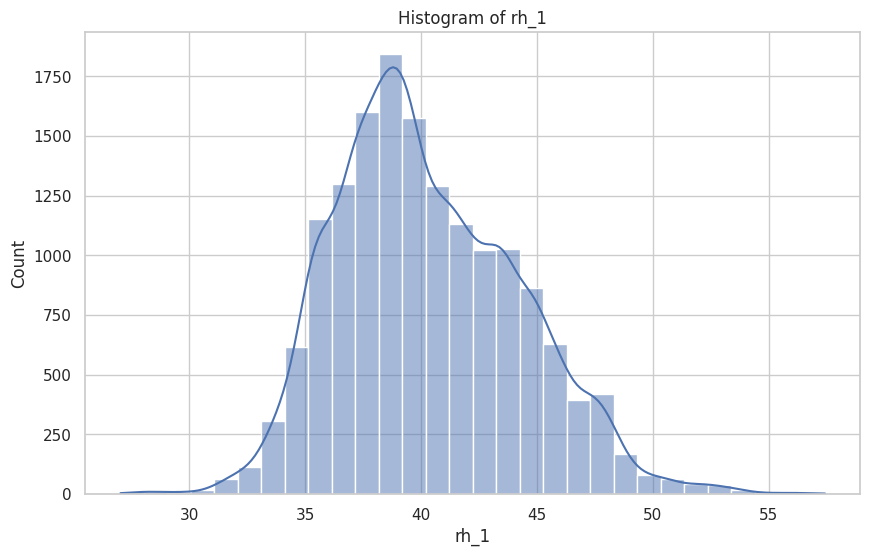

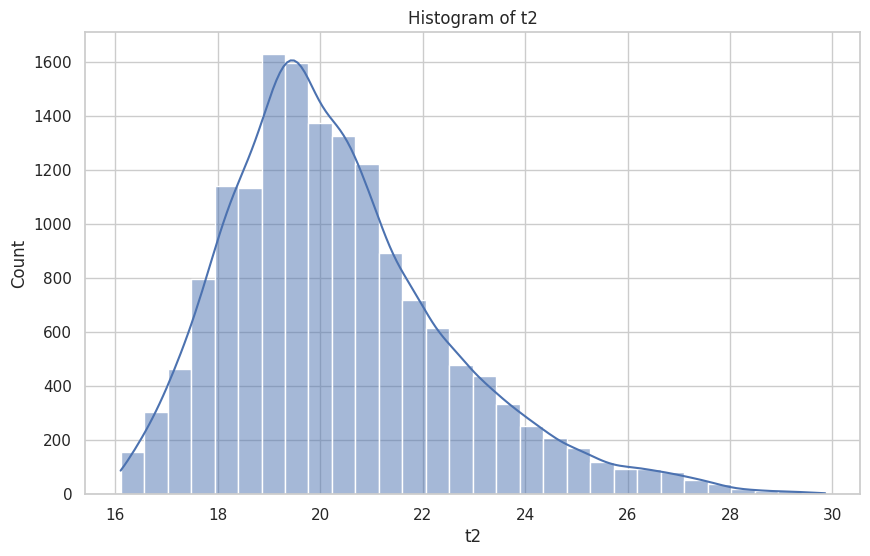

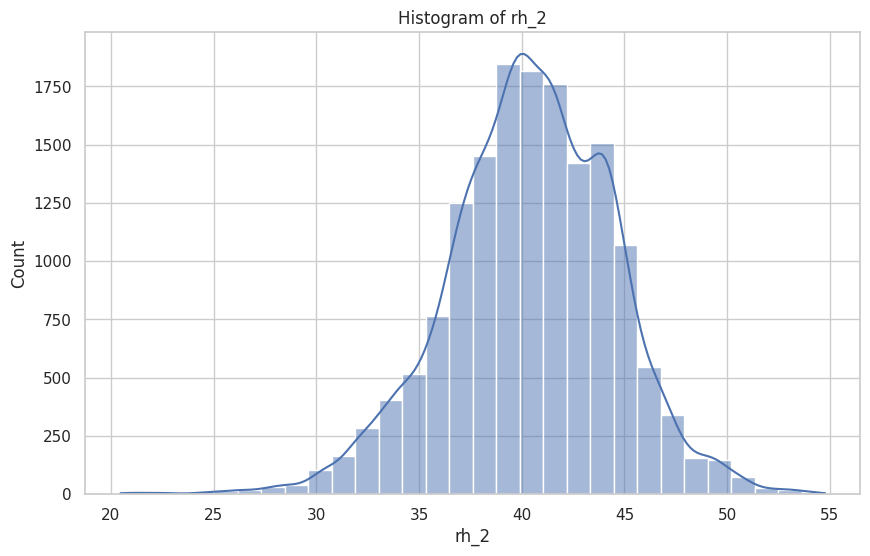

...

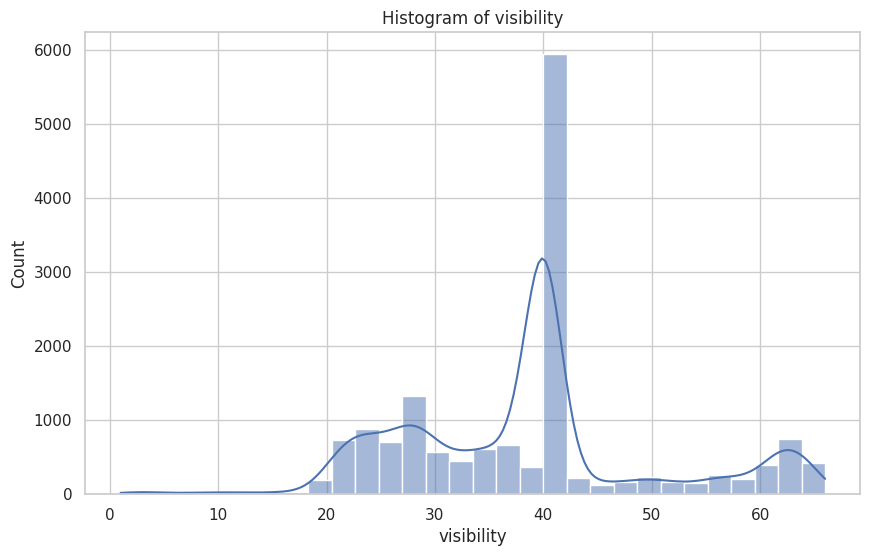

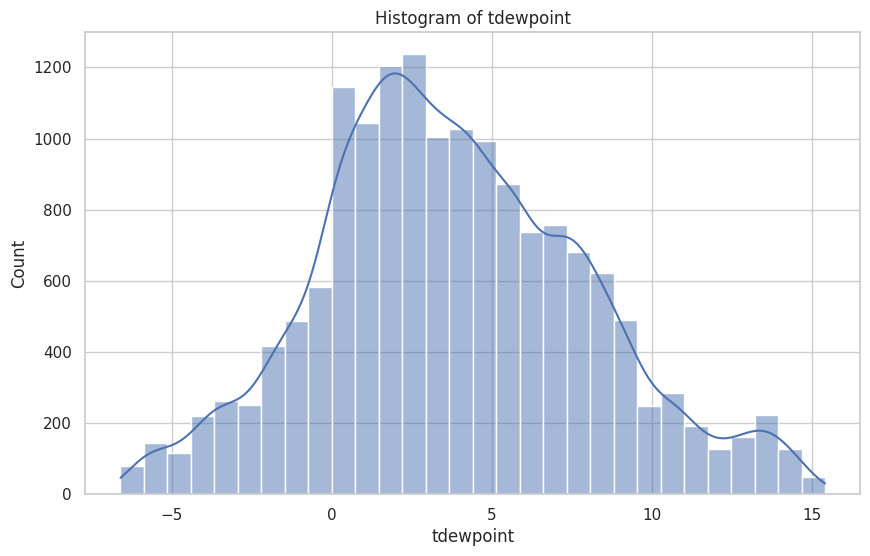

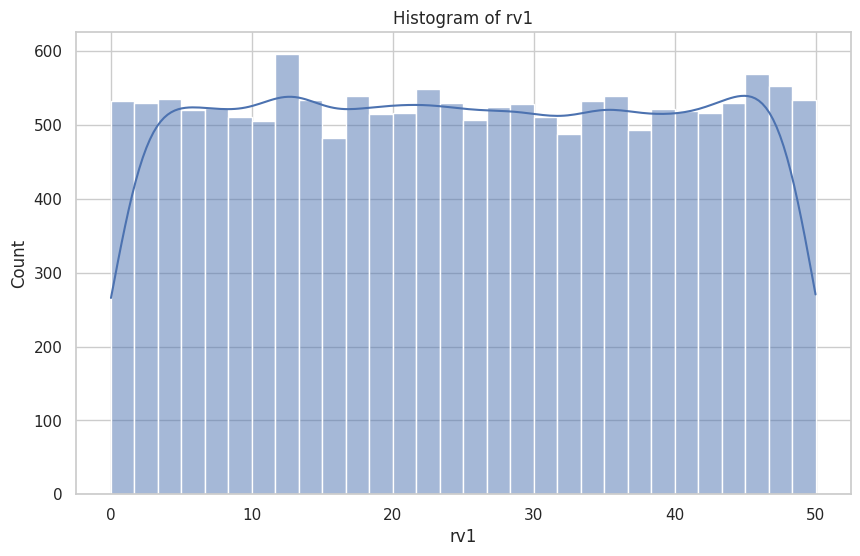

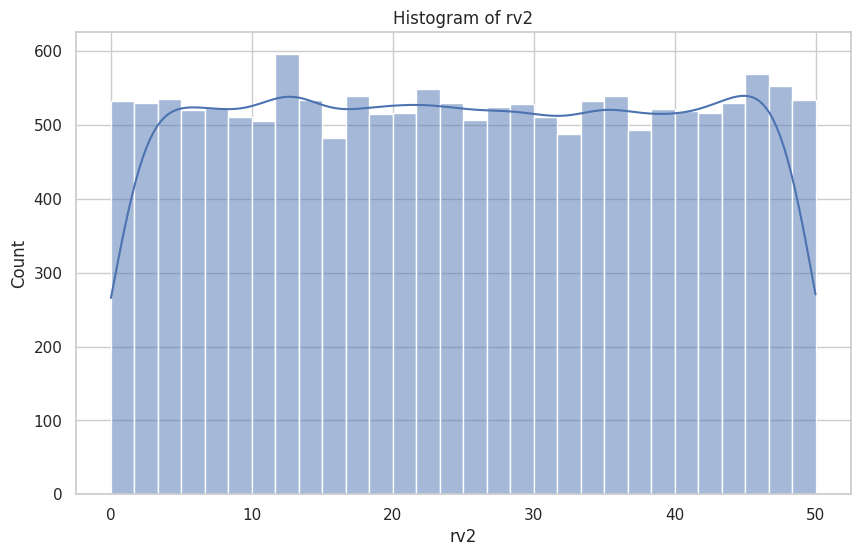

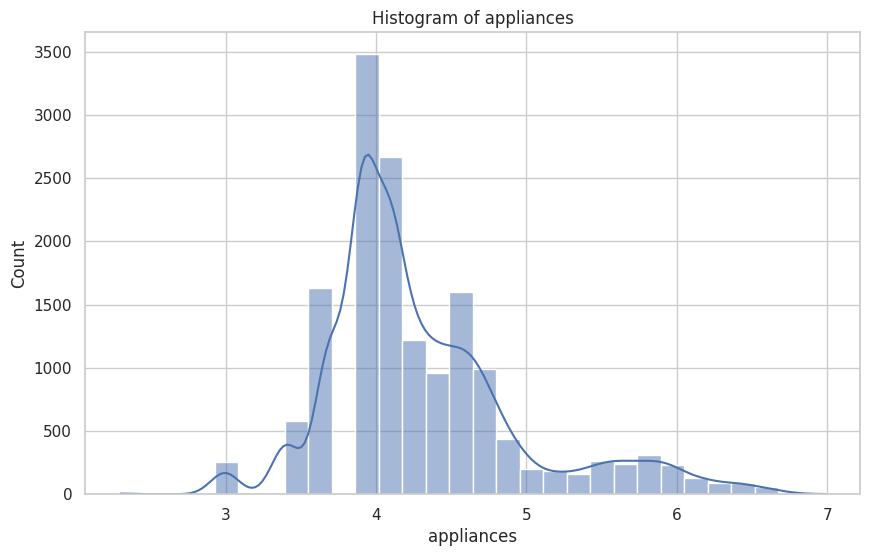

In [34]:
# Plot frequency distribution for numerical columns
for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    sns.histplot(train_copy[column], bins=30, kde=True)
    plt.title(f'Histogram of {column}')
    plt.show()

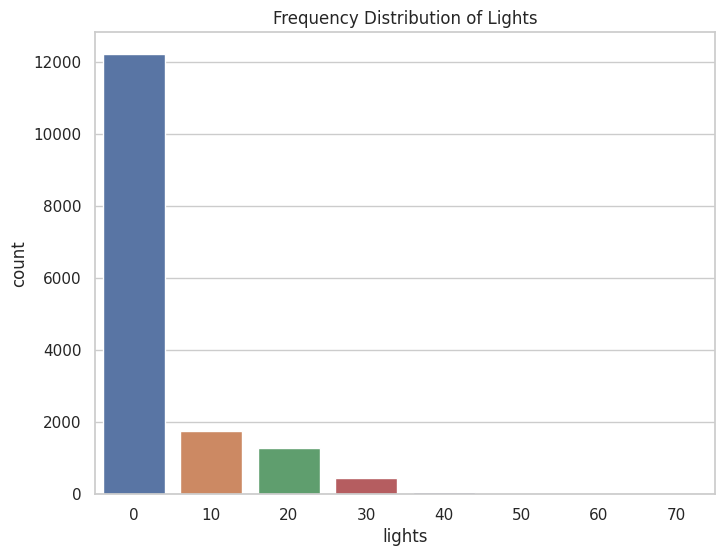

In [35]:
#Frequency distribution for lights
plt.figure(figsize=(8, 6))
sns.countplot(x='lights', data=train_copy)
plt.title('Frequency Distribution of Lights')
plt.show()

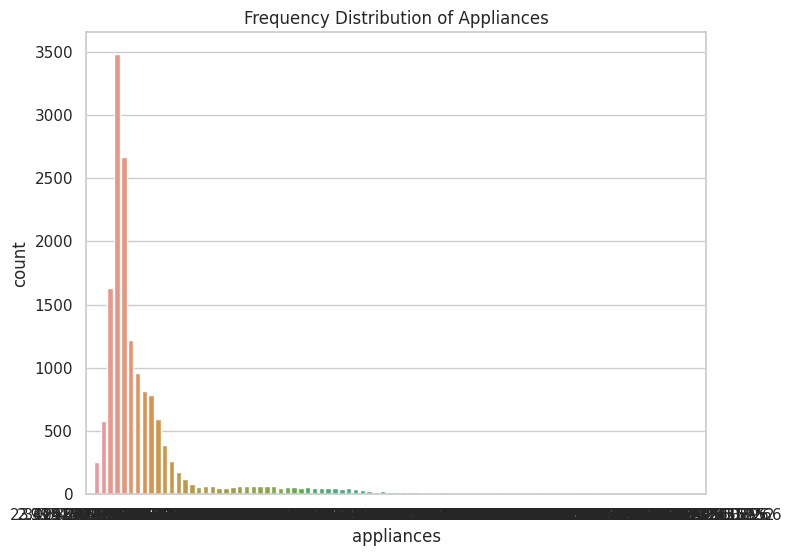

In [36]:
#Frequency distribution for appliances
plt.figure(figsize=(8, 6))
sns.countplot(x='appliances', data=train_copy)
plt.title('Frequency Distribution of Appliances')
plt.show()

# **Feature Engineering - Changing the datetime object to datetime variable**

In [37]:
# Feature engineering from the date column
train_copy['hour'] = train_copy['date'].dt.hour
train_copy['dayofweek'] = train_copy['date'].dt.dayofweek
train_copy['month'] = train_copy['date'].dt.month

test_copy['hour'] = test_copy['date'].dt.hour
test_copy['dayofweek'] = test_copy['date'].dt.dayofweek
test_copy['month'] = test_copy['date'].dt.month

# Drop the original date column as it won't be used directly
# Drop non-numeric columns or unnecessary columns
train_copy.drop(['date'], axis=1, inplace=True)
test_copy.drop(['date'], axis=1, inplace=True)

In [38]:
print(train_copy.info())
print(test_copy.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15788 entries, 0 to 15787
Data columns (total 31 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   lights       15788 non-null  int64  
 1   t1           15788 non-null  float64
 2   rh_1         15788 non-null  float64
 3   t2           15788 non-null  float64
 4   rh_2         15788 non-null  float64
 5   t3           15788 non-null  float64
 6   rh_3         15788 non-null  float64
 7   t4           15788 non-null  float64
 8   rh_4         15788 non-null  float64
 9   t5           15788 non-null  float64
 10  rh_5         15788 non-null  float64
 11  t6           15788 non-null  float64
 12  rh_6         15788 non-null  float64
 13  t7           15788 non-null  float64
 14  rh_7         15788 non-null  float64
 15  t8           15788 non-null  float64
 16  rh_8         15788 non-null  float64
 17  t9           15788 non-null  float64
 18  rh_9         15788 non-null  float64
 19  t_ou

In [39]:
train_copy.shape

(15788, 31)

In [40]:
test_copy.shape

(3947, 30)

**Ignore Warnings**

In [41]:
import warnings
warnings.filterwarnings('ignore')

# **Applying different models**

Splitting data into Training and Tests Sets

In [42]:
#Spliting the dataset in training and validation sets with train_test_split
from sklearn.model_selection import train_test_split

X = train_copy.drop(columns=['appliances']) 
y = train_copy['appliances']
#X_val = test_copy

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_testshape:", y_test.shape)

X_train shape: (12630, 30)
X_test shape: (3158, 30)
y_train shape: (12630,)
y_testshape: (3158,)


**Standardizing the Data**

Data scaling to normalize data to improve model performance.

In [44]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
test_scaled = scaler.transform(test_copy)


Building and Evaluating Models

In [45]:
# Ensure test_copy has the same columns as X
missing_cols = set(X.columns) - set(test_copy.columns)
for col in missing_cols:
    test_copy[col] = 0

test_copy = test_copy[X.columns]

In [46]:
# Handle infinite values
train_copy.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values
train_copy.dropna(inplace=True)

In [47]:
# Handle outliers
for col in train_copy.columns:
    q1 = train_copy[col].quantile(0.25)
    q3 = train_copy[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    train_copy = train_copy[(train_copy[col] >= lower_bound) & (train_copy[col] <= upper_bound)]

In [48]:
import math
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
#X_scaled = scaler.fit_transform(X)
# Train and evaluate models
models = [LinearRegression(), DecisionTreeRegressor(), RandomForestRegressor()]
for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = math.sqrt(mean_squared_error(y_test, y_pred))
    print(f"{model.__class__.__name__} RMSE: {rmse:.2f}")

#LinearRegression RMSE: 0.28
#DecisionTreeRegressor RMSE: 0.28
#RandomForestRegressor RMSE: 0.21

#LinearRegression RMSE: 0.54
#DecisionTreeRegressor RMSE: 0.52
#RandomForestRegressor RMSE: 0.38

LinearRegression RMSE: 0.54
DecisionTreeRegressor RMSE: 0.52
RandomForestRegressor RMSE: 0.38


**Linear Regression**

In [49]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Linear Regression
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

# Predictions
y_pred_train_lr = lr.predict(X_train_scaled)
y_pred_test_lr = lr.predict(X_test_scaled)

# Evaluation
rmse_train_lr = mean_squared_error(y_train, y_pred_train_lr, squared=False)
rmse_test_lr = mean_squared_error(y_test, y_pred_test_lr, squared=False)

print(f'Linear Regression RMSE (Train): {rmse_train_lr}')
print(f'Linear Regression RMSE (Test): {rmse_test_lr}')

#Linear Regression RMSE (Train): 0.5592164621581585
#Linear Regression RMSE (Test): 0.5439486406962866

Linear Regression RMSE (Train): 0.5592694134541785
Linear Regression RMSE (Test): 0.5440981526728847


**Random Forest Regressor**

In [50]:
from sklearn.ensemble import RandomForestRegressor
# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Predictions
y_pred_train_rf = rf.predict(X_train)
y_pred_test_rf = rf.predict(X_test)

# Evaluation
rmse_train_rf = mean_squared_error(y_train, y_pred_train_rf, squared=False)
rmse_test_rf = mean_squared_error(y_test, y_pred_test_rf, squared=False)

print(f'Random Forest RMSE (Train): {rmse_train_rf}')
print(f'Random Forest RMSE (Test): {rmse_test_rf}')

#Random Forest RMSE (Train): 0.14393568010767033
#Random Forest RMSE (Test): 0.38582780947596107

Random Forest RMSE (Train): 0.14393568010767033
Random Forest RMSE (Test): 0.38582780947596107


In [51]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor(n_estimators=100, random_state=42)
rfr.fit(X_train_scaled, y_train)

y_test_pred = rfr.predict(X_test_scaled)

rmse = mean_squared_error(y_test, y_test_pred, squared=False)
print(f'Validation RMSE: {rmse}')
#Validation RMSE: 0.38555855077981516

Validation RMSE: 0.38555855077981516


In [ ]:
from sklearn.model_selection import GridSearchCV
# Random Forest Regressor with Hyperparameter Tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': [1.0, 'sqrt'],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestRegressor(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train_scaled, y_train)

best_rf = grid_search.best_estimator_

# Predictions
y_pred_train_rf = best_rf.predict(X_train_scaled)
y_pred_test_rf = best_rf.predict(X_test_scaled)

# Evaluation
rmse_train_rf = mean_squared_error(y_train, y_pred_train_rf, squared=False)
rmse_test_rf = mean_squared_error(y_test, y_pred_test_rf, squared=False)

print(f'Random Forest RMSE (Train): {rmse_train_rf}')
print(f'Random Forest RMSE (Validation): {rmse_test_rf}')

# Use the best Random Forest model for prediction on test data
y_test_pred_rf = best_rf.predict(test_scaled)



#output for when 'max_features': ['auto', 'sqrt']
#Fitting 3 folds for each of 162 candidates, totalling 486 fits
#Random Forest RMSE (Train): 0.13777723164462738
#Random Forest RMSE (Validation): 0.3713661716035704

#output for when 'max_features': [1.0, 'sqrt']
#Random Forest RMSE (Train): 0.13702528311788537
#Random Forest RMSE (Validation): 0.37026654069068654

Evaluate Model with Cross-Validation
Cross-validation helps in assessing how the model generalizes to an independent dataset.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30]
}

grid_search = GridSearchCV(estimator=rfr, param_grid=param_grid, cv=3, n_jobs=-1, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

best_rfr = grid_search.best_estimator_

y_test_pred_best = best_rfr.predict(X_test_scaled)

best_rmse = mean_squared_error(y_test, y_test_pred_best, squared=False)
print(f'Best Validation RMSE: {best_rmse}')
#Best Validation RMSE: 0.38537894988813265

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'n_estimators': [100, 200, 300],
    'max_features': ['auto', 'sqrt'],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=50, cv=3, n_jobs=-1, verbose=2, random_state=42)
random_search.fit(X_train_scaled, y_train)

best_rf = random_search.best_estimator_

# Predictions
y_pred_train_rf = best_rf.predict(X_train_scaled)
y_pred_test_rf = best_rf.predict(X_test_scaled)

# Evaluation
rmse_train_rf = mean_squared_error(y_train, y_pred_train_rf, squared=False)
rmse_test_rf = mean_squared_error(y_test, y_pred_test_rf, squared=False)

print(f'Random Forest RMSE (Train): {rmse_train_rf}')
print(f'Random Forest RMSE (Validation): {rmse_test_rf}')

# Use the best Random Forest model for prediction on test data
y_test_pred_rf = best_rf.predict(test_scaled)


In [55]:
from sklearn.svm import SVR

# Support Vector Machine (SVM) Regressor
svm_model = SVR()
svm_model.fit(X_train, y_train)
svm_predictions = svm_model.predict(X_test)
print("SVM MSE:", mean_squared_error(y_test, svm_predictions))

# SVM MSE: 0.34377780226855786

SVM MSE: 0.34377780226855786


# **Prediction and Submission**

In [67]:
forest_model = RandomForestRegressor()
forest_model.fit(X_train, y_train)

RandomForestRegressor()

In [68]:
# Running Random Forest Regressor on  test data
test_random_forest = forest_model.predict(test_copy)

In [69]:
# Check the length of test_random_forest
len_test_random_forest = len(test_random_forest)

# Create the DataFrame with the correct length
submission = pd.DataFrame({"ID": np.arange(1, 1 + len_test_random_forest),
                           "appliances": test_random_forest})

# Save the DataFrame to CSV
submission.to_csv('submission.csv', index=False)

In [70]:
submission.head()

,ID,appliances
0,1,3.971185
1,2,4.875283
2,3,3.768809
3,4,4.100065
4,5,4.281984


In [71]:
submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3947 entries, 0 to 3946
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          3947 non-null   int64  
 1   appliances  3947 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 61.8 KB


**Linear Regression (RMSE: 0.54):**

Performance: It's performing reasonably well, with a moderate level of error in predictions.

Insight: Linear regression is a good baseline model, but since our goal is to achieve higher accuracy, a more complex model or improving feature engineering is a better choice. This model iss assuming linear relationship even among non-linear parameters of the data, hence is underfitting (higher bias).



**Decision Tree Regressor (RMSE: 0.52):**

Performance: Similar to linear regression, it's performing comparably with a slightly lower RMSE.

Insight: Decision trees tend to capture non-linear relationships better than linear models. 



**Random Forest Regressor (RMSE: 0.38):**

Performance: This model shows the lowest RMSE among the three, indicating better predictive power.

Insight: Random forests are effective in handling complex relationships and reducing overfitting. It has many deep branches that fits the training data perfectly but is falling short when it iss coming to generalise the test data. Since it's performing the best so far, optimizing hyperparameters or exploring feature importance could be beneficial.

**Gradient Boosting Method**

In [105]:
warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn")

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(random_state=42)
gbr.fit(X_train_scaled, y_train)

# Predictions
y_pred_train_gbr = gbr.predict(X_train_scaled)
y_pred_test_gbr = gbr.predict(X_test_scaled)

# Evaluation
rmse_train_gbr = mean_squared_error(y_train, y_pred_train_gbr, squared=False)
rmse_test_gbr = mean_squared_error(y_test, y_pred_test_gbr, squared=False)

print(f'Gradient Boosting RMSE (Train): {rmse_train_gbr}')
print(f'Gradient Boosting RMSE (Validation): {rmse_test_gbr}')

#Gradient Boosting RMSE (Train): 0.46732880197251986
#Gradient Boosting RMSE (Validation): 0.4732871196606267

**Hyperparamter Tuning for Gradient Boosting Method**

In [ ]:
# Initialize Gradient Boosting Regressor
gbr = GradientBoostingRegressor()

# Hyperparameter tuning using Grid Search CV
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'subsample': [0.8, 0.9, 1.0]
}

grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_

# Predict on validation set
y_pred_test = best_model.predict(X_test)

# Calculate RMSE
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
print(f'Test Validation RMSE: {rmse_test}')

#Test Validation RMSE: 0.4103065440140708

In [ ]:
param_grid_gbr = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

gbr = GradientBoostingRegressor(random_state=42)
grid_search_gbr = GridSearchCV(estimator=gbr, param_grid=param_grid_gbr, cv=3, n_jobs=-1, verbose=2)
grid_search_gbr.fit(X_train_scaled, y_train)

best_gbr = grid_search_gbr.best_estimator_

# Predictions
y_pred_train_gbr = best_gbr.predict(X_train_scaled)
y_pred_test_gbr = best_gbr.predict(X_test_scaled)

# Evaluation
rmse_train_gbr = mean_squared_error(y_train, y_pred_train_gbr, squared=False)
rmse_test_gbr = mean_squared_error(y_test, y_pred_test_gbr, squared=False)

print(f'Gradient Boosting RMSE (Train): {rmse_train_gbr}')
print(f'Gradient Boosting RMSE (Validation): {rmse_test_gbr}')

#Fitting 3 folds for each of 243 candidates, totalling 729 fits
#Gradient Boosting RMSE (Train): 0.18646553721078943
#Gradient Boosting RMSE (Validation): 0.3829518377421923